Pada code colab ini saya membuat implementasi image enhancement untuk beberapa jenis image. Yaitu :

1. Image gelap = menerangkan menggunakan negative dan juga logaritmic transformation
2. Image terang = menggelapkan menggunakan gamma transformation
3. Image contrast rendah = menaikan contrast menggunakan histogram equalisation
4. Image blur = mengesharpkan image dengan laplacian filter

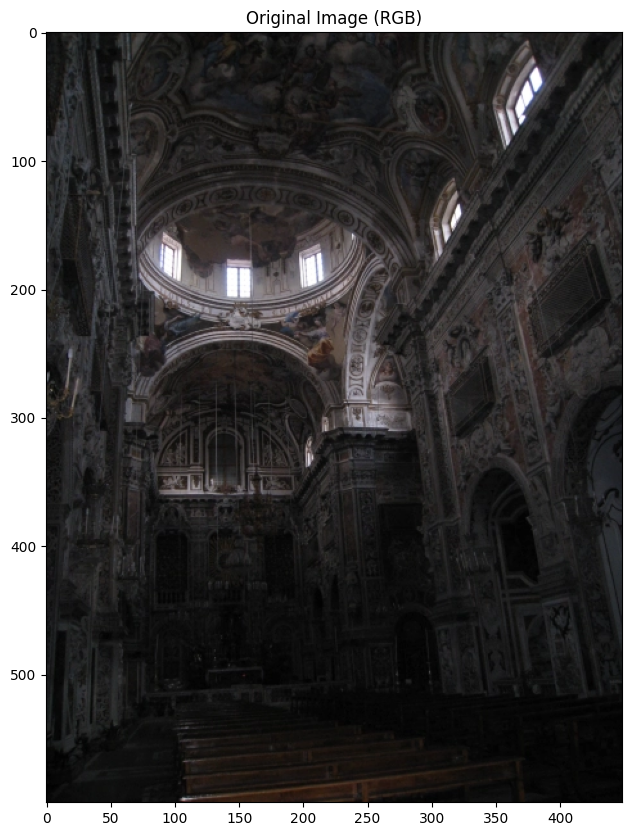

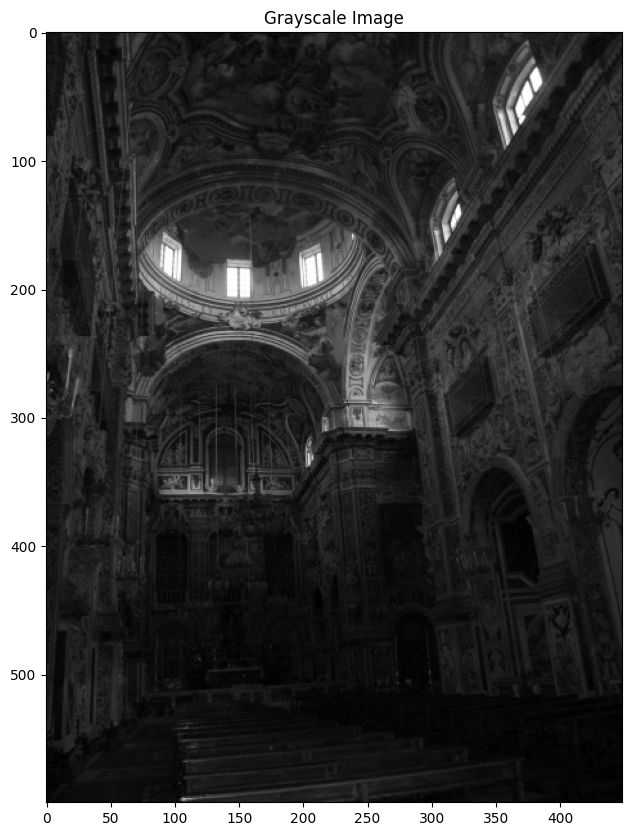

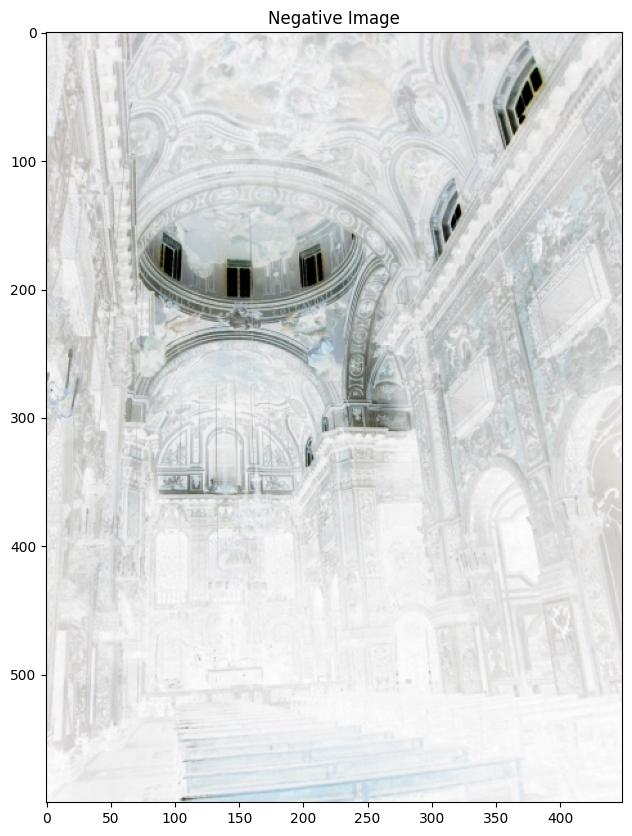

In [2]:
#Image negative

#Load gambar original dan juga buat gray_image nya
import matplotlib.pyplot as plt
import cv2
image = cv2.imread('/content/s-caterina-interior.jpg')

#Ubah warna BGR jadi RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#Buat menjadi gray immage
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
negative_image = 255 - image_rgb

#Tampilkan original image grayscale dan negative image
plt.figure(figsize=(12,10))
plt.imshow(image_rgb)
plt.title('Original Image (RGB)')
plt.show()

plt.figure(figsize=(12,10))
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.show()


plt.figure(figsize=(12,10))
plt.imshow(negative_image)
plt.title('Negative Image')
plt.show()




Max pixel value 255


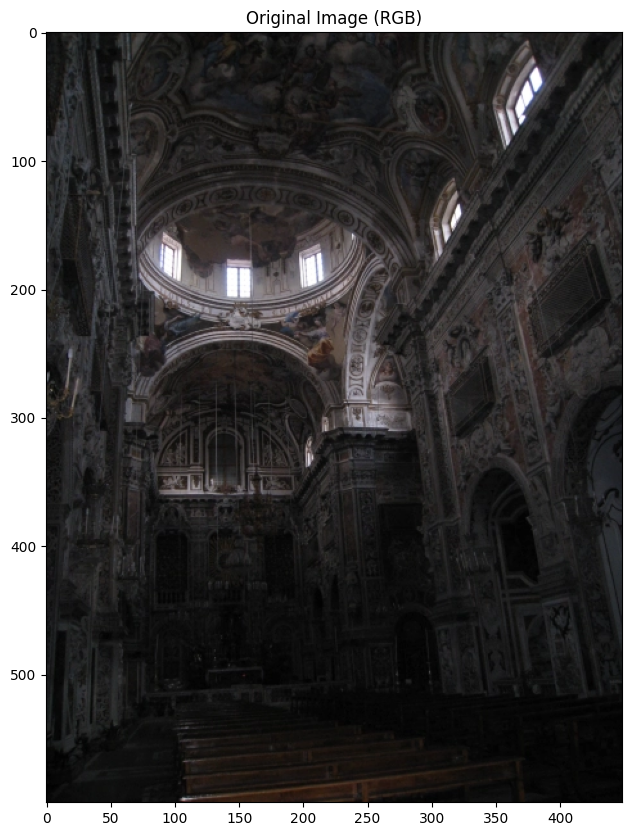

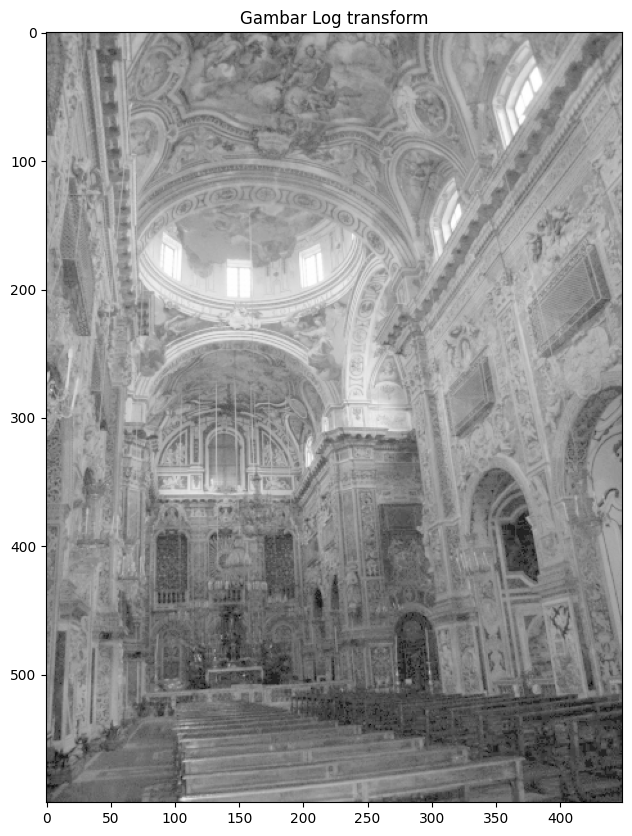

In [3]:
#Log-log transform

import numpy as np
import matplotlib.pyplot as plt
import cv2
image = cv2.imread('/content/s-caterina-interior.jpg')

#Ubah warna BGR jadi RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


#Buat menjadi gray immage
gray_image = cv2.imread('/content/s-caterina-interior.jpg', cv2.IMREAD_GRAYSCALE)
print("Max pixel value", np.max(gray_image))
C = 255 / np.log(1 + float(np.max(gray_image))) #perhitungan c untuk mengekspand dark value dan meningkatkan detail di dark area


gambar_log_transform = C * np.log(1 + gray_image.astype(np.float32))
gambar_log_transform = np.array(gambar_log_transform, dtype=np.uint8) #terapkan log transform

#tampilkan plot gambar ori dan hasil log transform
plt.figure(figsize=(12,10))
plt.imshow(image_rgb)
plt.title('Original Image (RGB)')
plt.show()

plt.figure(figsize=(12,10))
plt.imshow(gambar_log_transform, cmap = 'gray')
plt.title('Gambar Log transform')
plt.show()

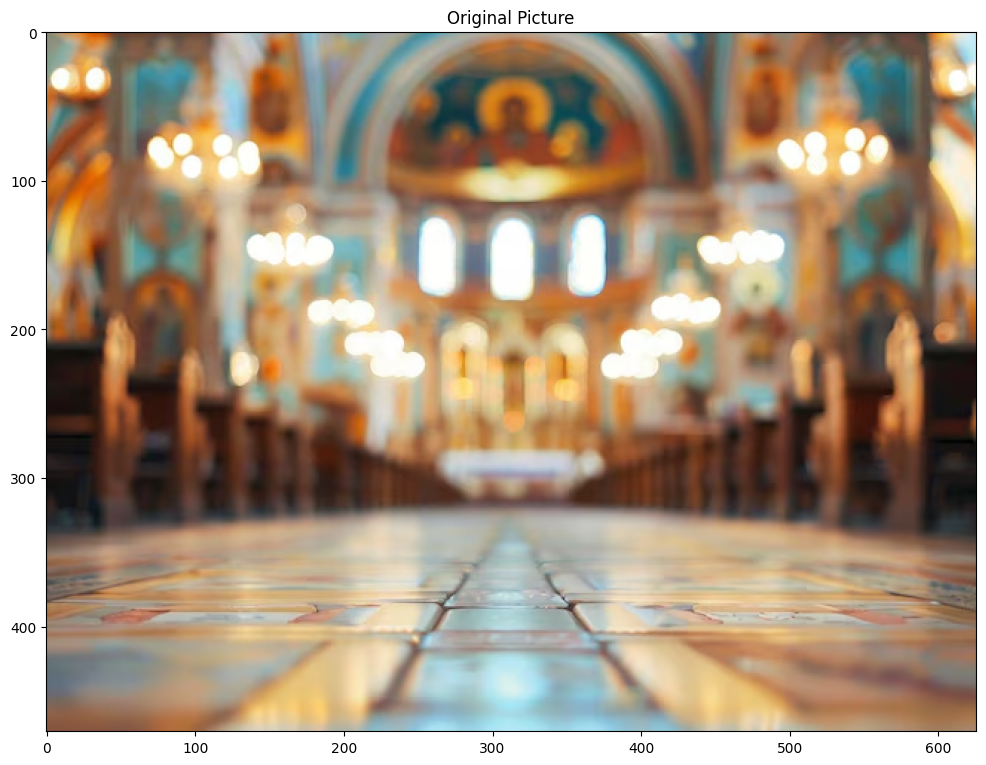

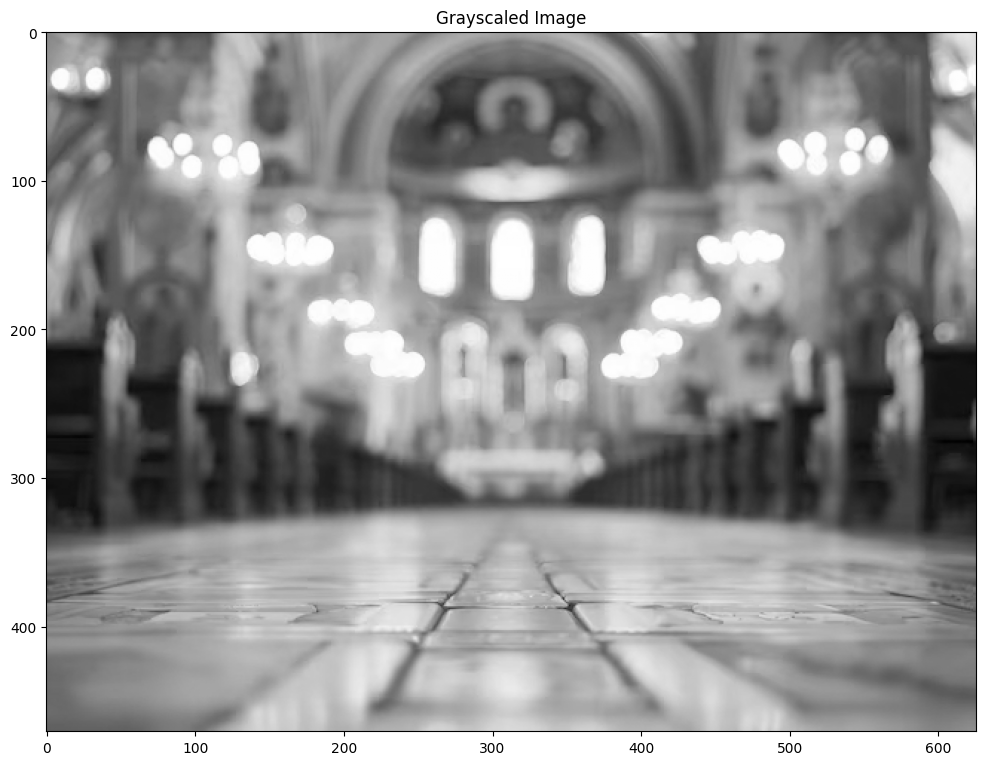

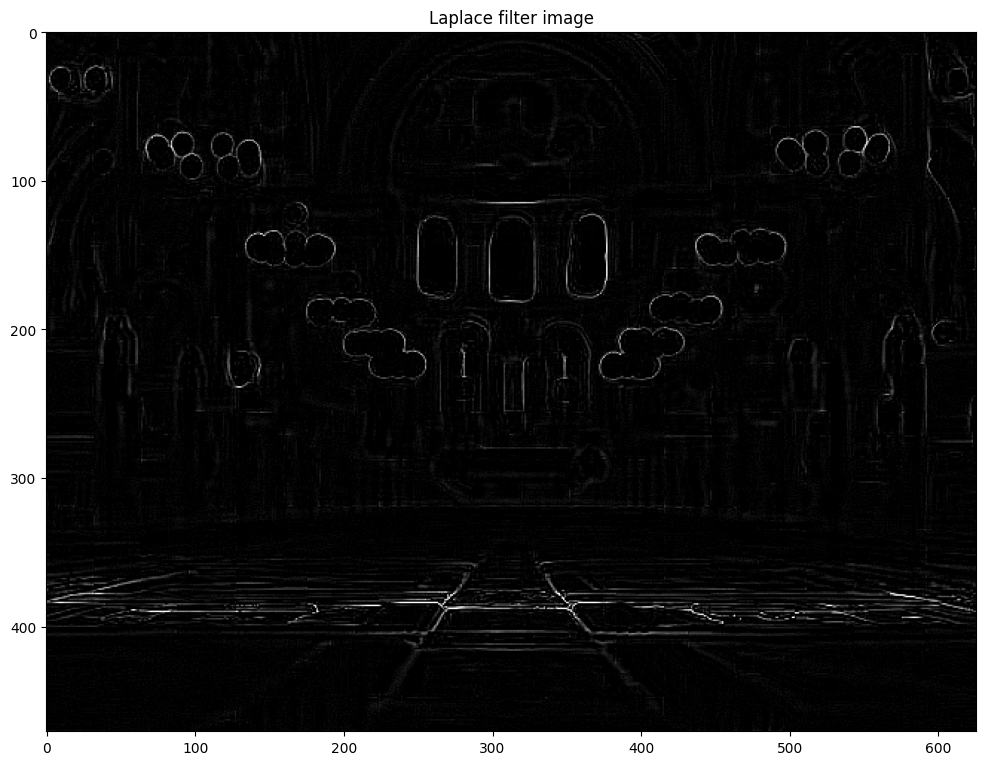

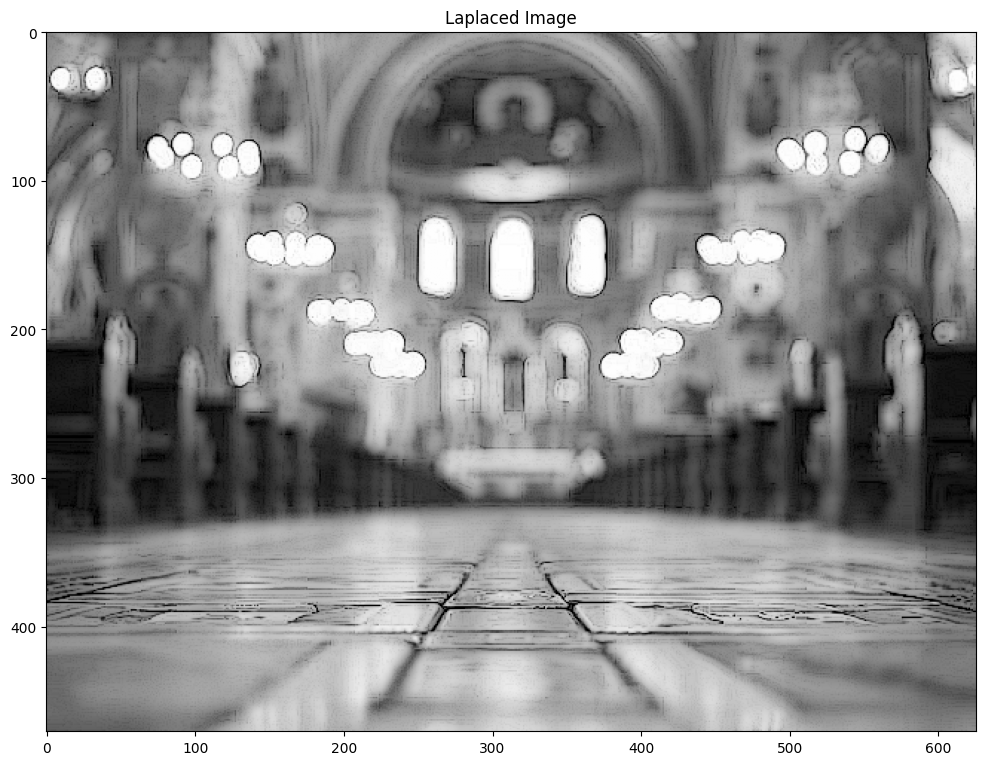

In [4]:
# Laplacian Transform
import numpy as np
import matplotlib.pyplot as plt
import cv2
img = cv2.imread('/content/blurred-orthodox-church-interior-with-no-people-classical-interior-light-colors-background_935074-28797.png')

#Ubah warna BGR jadi RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,10))
plt.title('Original Picture')
plt.imshow(img_rgb, cmap='gray')
plt.show()


#ubah jadi grayscale
gray_img = cv2.imread('/content/blurred-orthodox-church-interior-with-no-people-classical-interior-light-colors-background_935074-28797.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12,10))
plt.title('Grayscaled Image')
plt.imshow(gray_img, cmap='gray')
plt.show()


#Buat Kernel Laplacian
kernel = np.array([[1, 1, 1],
                   [1, -8, 1],
                   [1, 1, 1]])

LaplacianImage = cv2.filter2D(src=gray_img, ddepth=-1, kernel=kernel) #dapatkan gambar detail dari image

#tampilkan gambar detail
plt.figure(figsize=(12,10))
plt.title('Laplace filter image')
plt.imshow(LaplacianImage, cmap='gray')
plt.show()

c = -1
#nilai c = 1 kalau tengahnya kernel positif dan -1 kalau tengahnya kernel negatif

gray_img_float = gray_img.astype(np.float32)
laplacian_float = LaplacianImage.astype(np.float32) #terapkan gambar detail dari image

result = gray_img_float + c*laplacian_float #gabungkan gambar awal yang blur dengan gambar detail agar gambar lebih sharp

#Clip value ke 0-255 (di treshold) dan convert kembali ke uint8 agar tetap dalam range grayscale
result = np.clip(result, 0, 255).astype(np.uint8)


#tampilkan gambar laplaced
plt.figure(figsize=(12,10))
plt.title('Laplaced Image')
plt.imshow(result, cmap='gray')
plt.show()



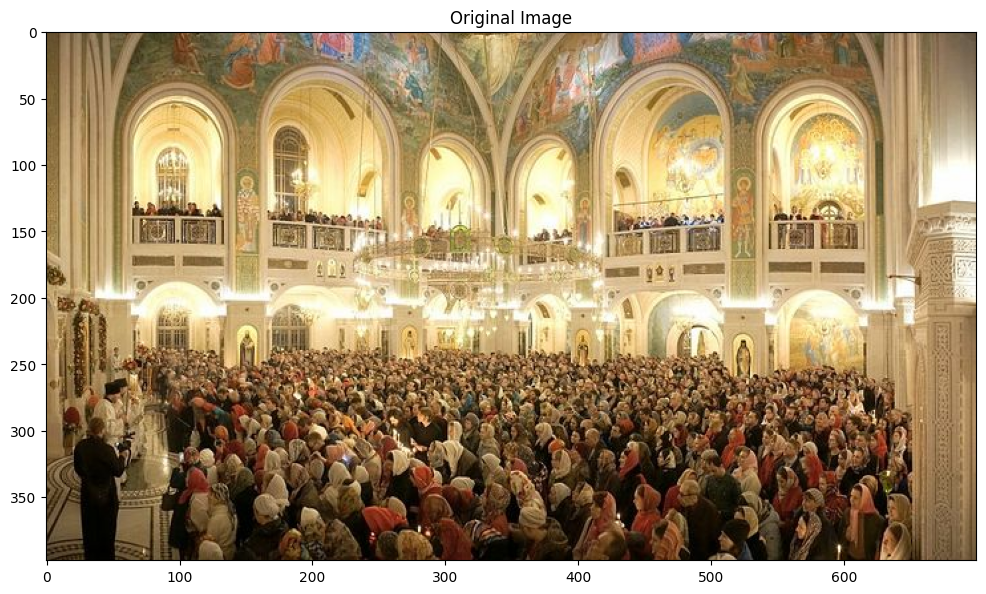

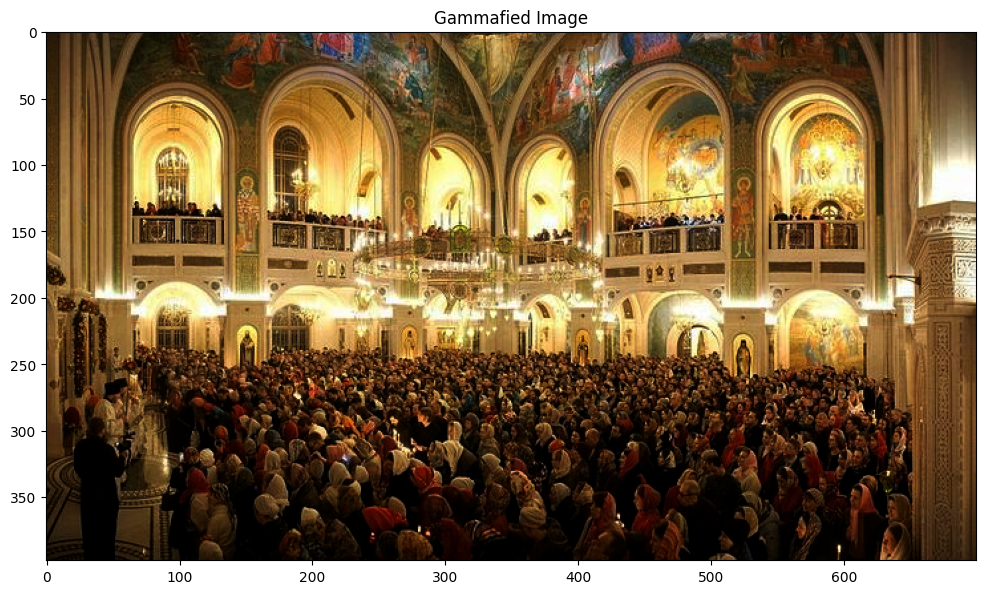

In [10]:
#Gamma transformation
import cv2
import numpy as np

gambar = cv2.imread('/content/Pascha Image.jpg') #upload gambar
gambar = cv2.cvtColor(gambar, cv2.COLOR_BGR2RGB)        # convert ke RGB

#buat gamma correction function
def apply_gamma_correction(image, gamma) :
  #kita normalsasi intenstas pixel jadi range [0,1.0]
  normalized = gambar / 255.0
  gamma_corrected = np.power(normalized, gamma)

  gamma_corrected = np.array(gamma_corrected * 255, dtype='uint8')
  return gamma_corrected


gamma = 2.0  #berikan nilai gama makin tinggi makin gelap

gamma_corrected_image = apply_gamma_correction(gambar, gamma) #terapkan fungsi yang telah kita buat

#tampilkan gambar original dan hasil gamafied image
plt.figure(figsize=(12,10))
plt.title('Original Image')
plt.imshow(gambar, cmap='gray')
plt.show()
plt.close()

plt.figure(figsize=(12,10))
plt.title('Gammafied Image')
plt.imshow(gamma_corrected_image, cmap='gray')
plt.show()
plt.close()

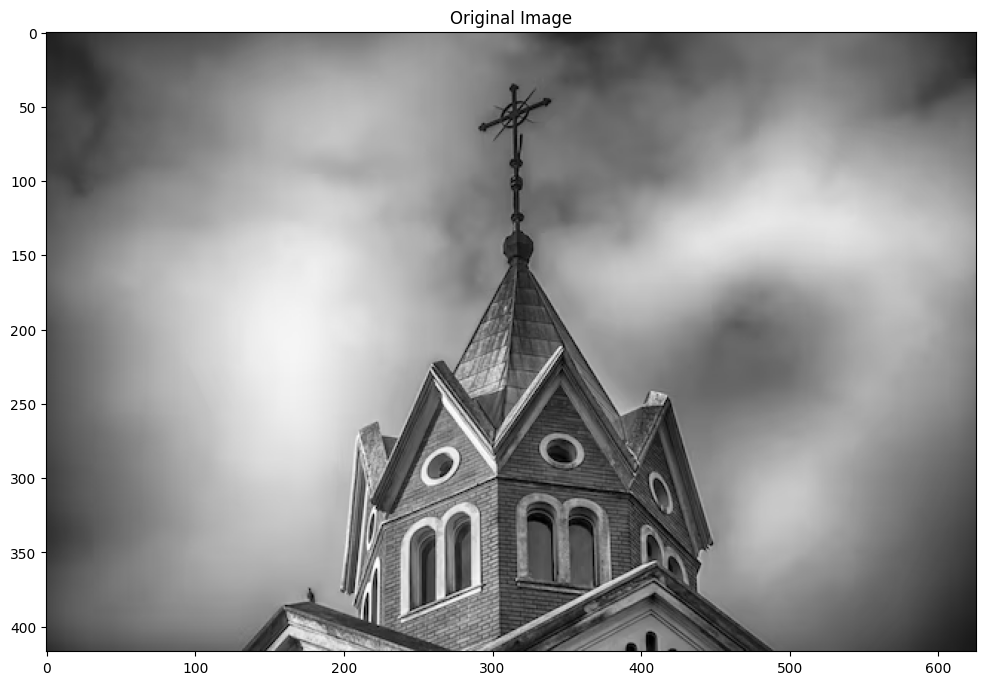

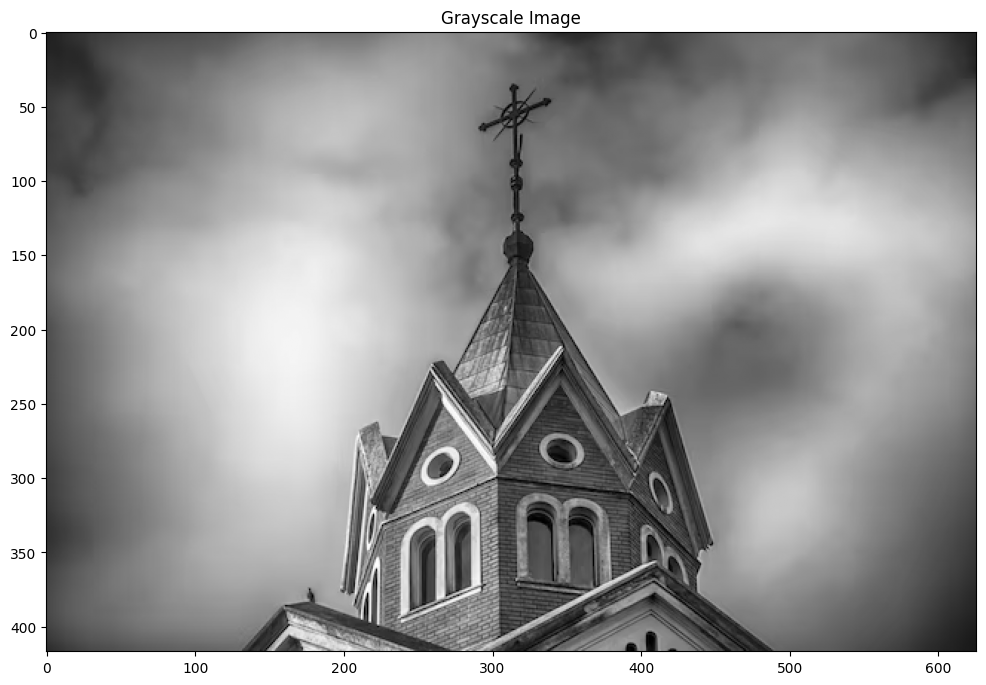

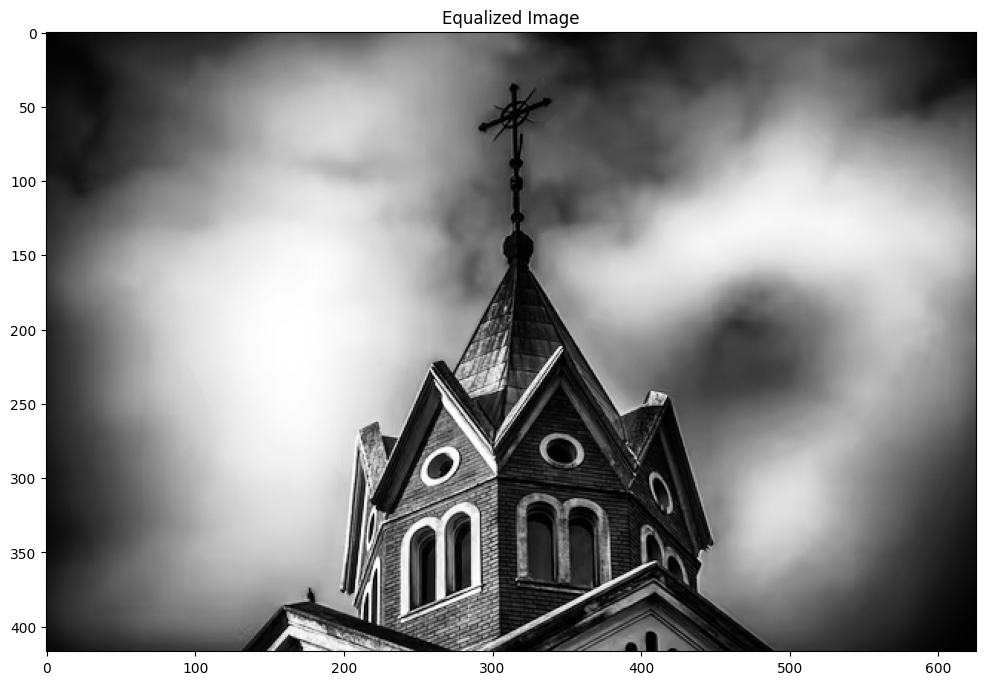

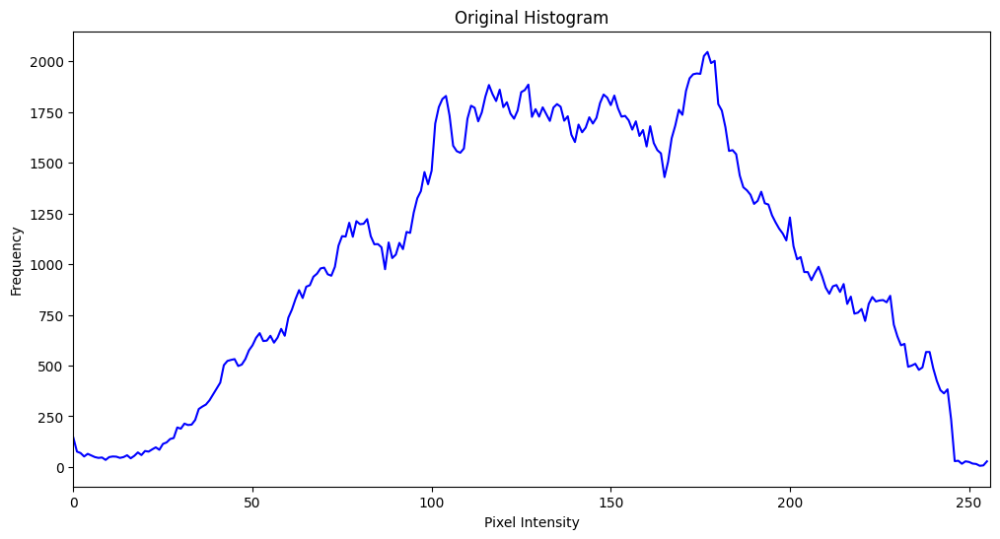

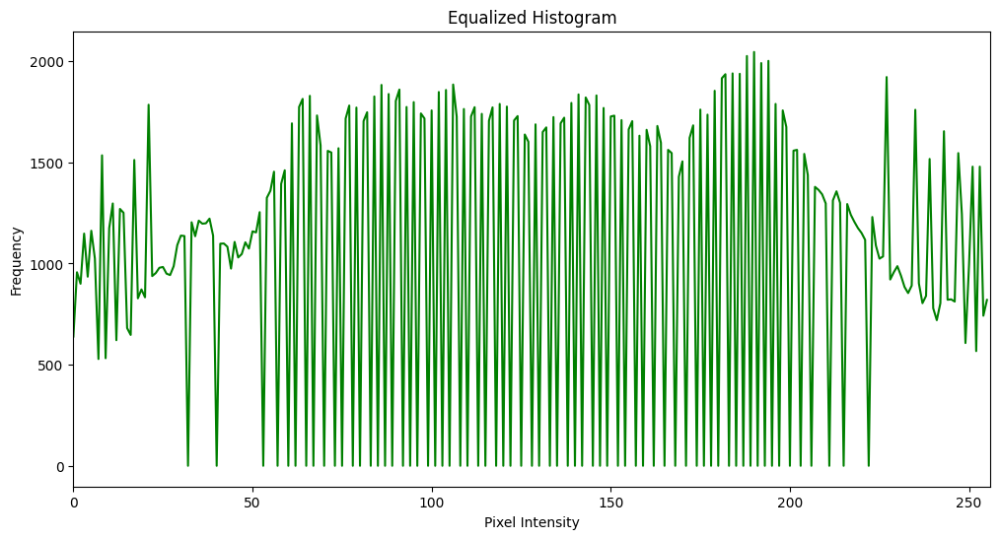

In [15]:
#Histogram Equalisation
import cv2
import numpy as np
import matplotlib.pyplot as plt

gambar = cv2.imread('/content/low-angle-greyscale-shot-top-christian-church-with-cloudy-sky_181624-2173.png') #load gambar ori
gambar = cv2.cvtColor(gambar, cv2.COLOR_BGR2RGB)        # convert to RGB

#tampilan gambar ori
plt.figure(figsize=(12,10))
plt.title('Original Image')
plt.imshow(gambar, cmap='gray')
plt.show()

#tampilkan gambar grayscale

gray_image = cv2.imread('/content/low-angle-greyscale-shot-top-christian-church-with-cloudy-sky_181624-2173.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12,10))
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.show()

#terapkan histogram equalisation
equalized_img = cv2.equalizeHist(gray_image)

#tampilkan
plt.figure(figsize=(12,10))
plt.title('Equalized Image')
plt.imshow(equalized_img, cmap='gray')
plt.show()


#ambil data histogram ori dan equalized
hist_original = cv2.calcHist([gambar], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_img], [0], None, [256], [0, 256])

# Histogram untuk original grayscale image
plt.figure(figsize=(12,6))
plt.title('Original Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.plot(hist_original, color='blue')
plt.xlim([0,256])
plt.show()

# Histogram untuk equalized image
plt.figure(figsize=(12,6))
plt.title('Equalized Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.plot(hist_equalized, color='green')
plt.xlim([0,256])
plt.show()


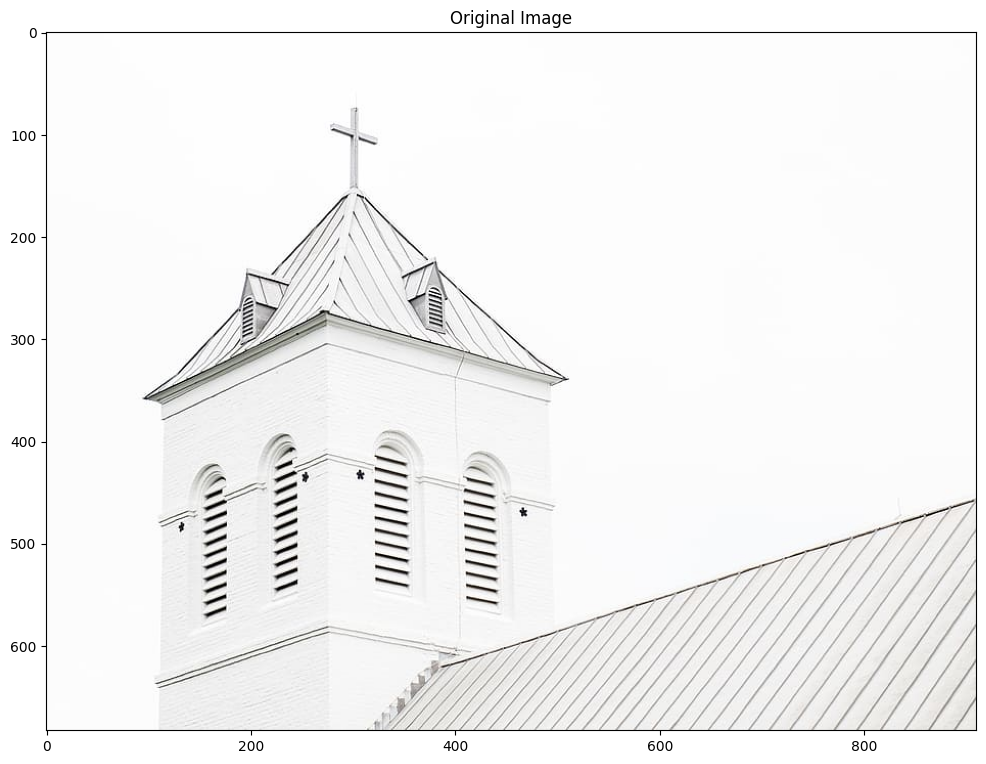

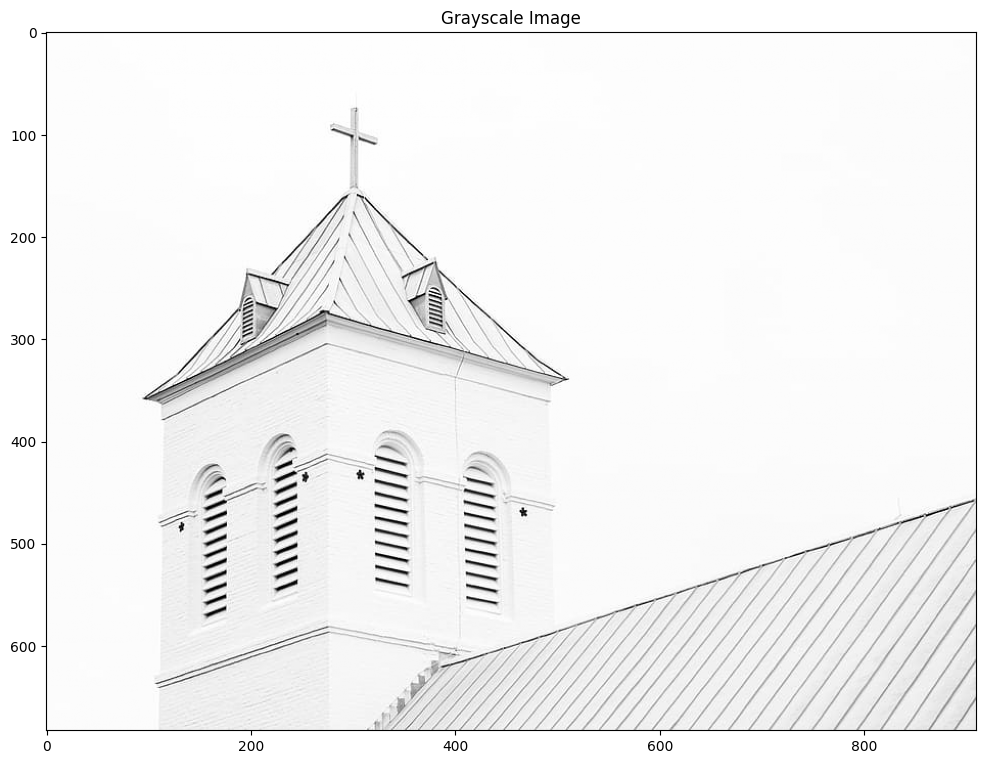

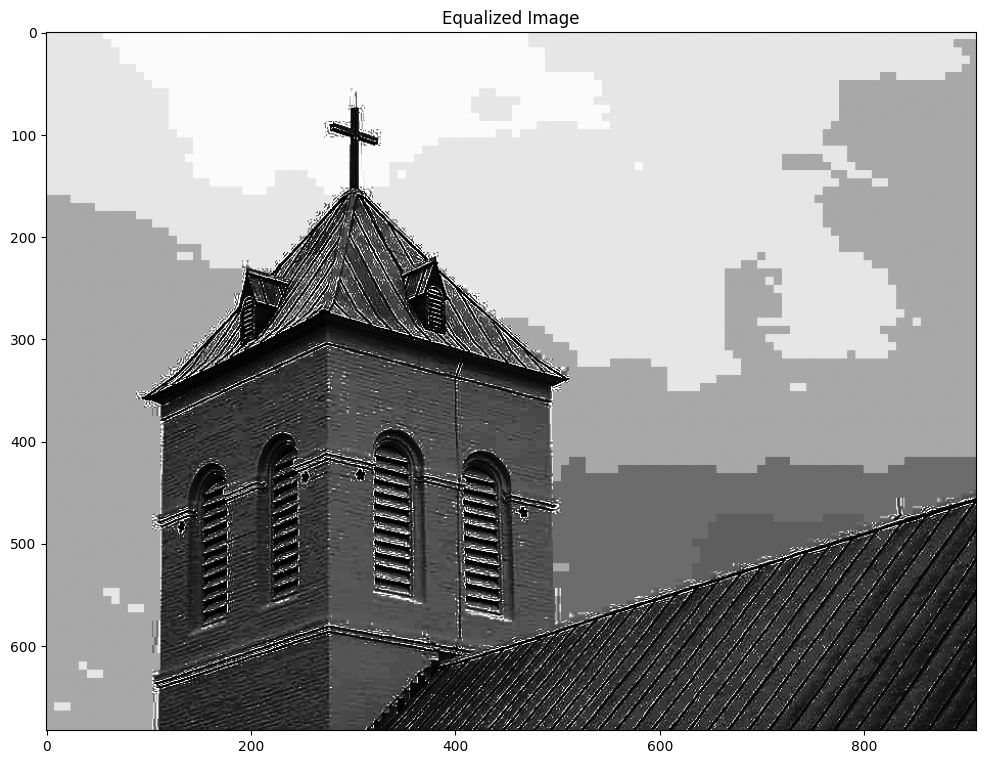

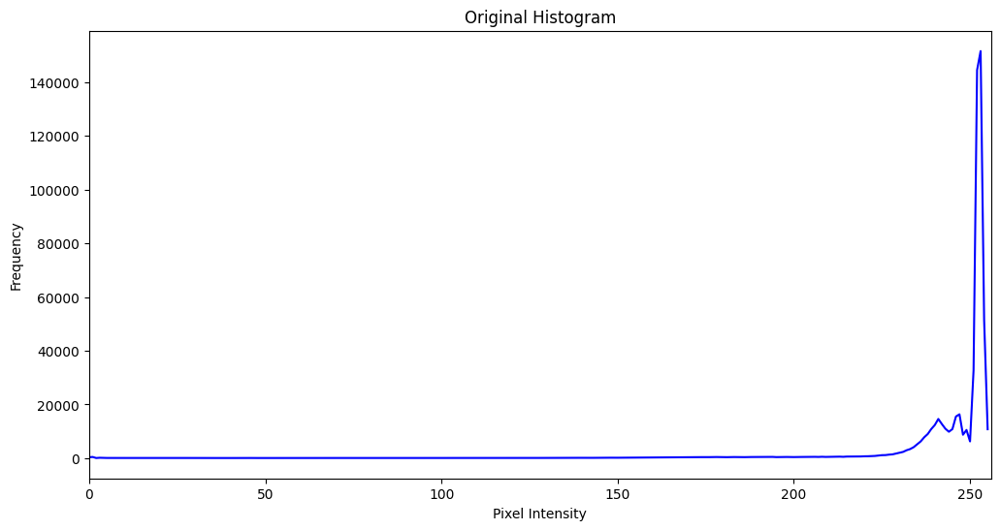

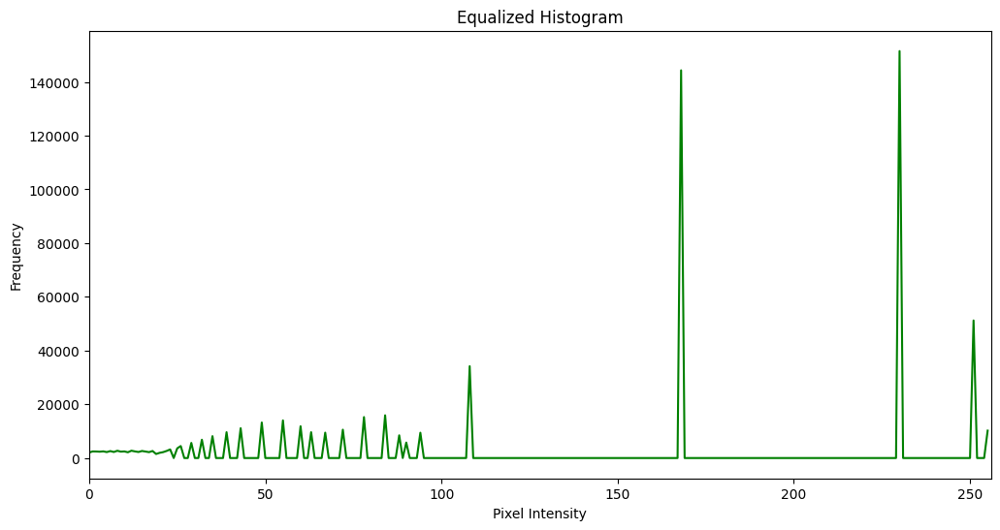

In [16]:
#Histogram Equalisation
import cv2
import numpy as np
import matplotlib.pyplot as plt

gambar = cv2.imread('/content/contrast-building-church-line.jpg')
gambar = cv2.cvtColor(gambar, cv2.COLOR_BGR2RGB)        # convert to RGB

plt.figure(figsize=(12,10))
plt.title('Original Image')
plt.imshow(gambar, cmap='gray')
plt.show()

gray_image = cv2.imread('/content/contrast-building-church-line.jpg', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12,10))
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.show()

equalized_img = cv2.equalizeHist(gray_image)

plt.figure(figsize=(12,10))
plt.title('Equalized Image')
plt.imshow(equalized_img, cmap='gray')
plt.show()

hist_original = cv2.calcHist([gambar], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_img], [0], None, [256], [0, 256])

# Histogram for original grayscale image
plt.figure(figsize=(12,6))
plt.title('Original Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.plot(hist_original, color='blue')
plt.xlim([0,256])
plt.show()

# Histogram for equalized image
plt.figure(figsize=(12,6))
plt.title('Equalized Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.plot(hist_equalized, color='green')
plt.xlim([0,256])
plt.show()

